In [29]:
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import os

In [2]:
from wildlife_datasets import datasets


datasets.ATRW.get_data('./data/ATRW')

DATASET ATRW: DOWNLOADING STARTED.


atrw_detection_test.tar.gz: 1.49GB [06:01, 4.13MB/s]                               
atrw_reid_train.tar.gz: 139MB [00:32, 4.22MB/s]                              
atrw_anno_reid_train.tar.gz: 106kB [00:01, 93.3kB/s]                             
atrw_reid_test.tar.gz: 96.9MB [00:25, 3.87MB/s]                              
atrw_anno_reid_test.tar.gz: 90.1kB [00:00, 91.5kB/s]                            
main.zip: 30.7MB [00:15, 1.98MB/s]


DATASET ATRW: EXTRACTING STARTED.
DATASET ATRW: FINISHED.



In [57]:
dataset = datasets.ATRW('../data/ATRW')
df = dataset.df

In [58]:
df = df[df['path'].str.startswith(tuple(('atrw_reid_train', 'atrw_reid_test')))]

In [59]:
df.sample(n = 10)

,image_id,identity,path,bbox,keypoints,original_split
5276,f937c8fddbe66ab0,217,atrw_reid_train\train\004464.jpg,NaN,"[415, 89, 2, 388, 108, 2, 472, 194, 2, 331, 20...",train
3808,b38e5ff5f816ac6e,52,atrw_reid_test\test\002688.jpg,NaN,"[862, 87, 2, 941, 128, 2, 942, 276, 2, 699, 32...",test
3391,a098b2eb31385511,72,atrw_reid_train\train\003635.jpg,NaN,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",train
5152,f3bd5ad57c8389a8,180,atrw_reid_test\test\001372.jpg,NaN,"[249, 97, 2, 0, 0, 0, 136, 276, 2, 400, 395, 2...",test
617,1d6408264d31d453,237,atrw_reid_train\train\005005.jpg,NaN,"[132, 34, 2, 105, 24, 2, 51, 116, 2, 305, 201,...",train
2611,7cbbc409ec990f19,102,atrw_reid_test\test\000070.jpg,NaN,"[133, 116, 2, 73, 115, 2, 23, 292, 2, 0, 0, 0,...",test
548,194cf6c2de8e00c0,73,atrw_reid_test\test\002096.jpg,NaN,"[207, 20, 2, 230, 30, 2, 239, 62, 2, 202, 94, ...",test
5221,f718499c1c8cef67,81,atrw_reid_train\train\000256.jpg,NaN,"[33, 30, 2, 0, 0, 0, 27, 58, 2, 0, 0, 0, 96, 9...",train
4185,c82a7178ece03ba6,166,atrw_reid_test\test\004663.jpg,NaN,"[300, 39, 2, 317, 41, 2, 315, 90, 2, 240, 109,...",test
4140,c61f571dbd2fb949,220,atrw_reid_train\train\002880.jpg,NaN,"[196, 27, 2, 229, 36, 2, 0, 0, 0, 181, 132, 2,...",train


C:\Users\matej\AppData\Local\Temp\ipykernel_121276\3694100457.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=instance_count_distribution.index, y=instance_count_distribution.values, palette="viridis")


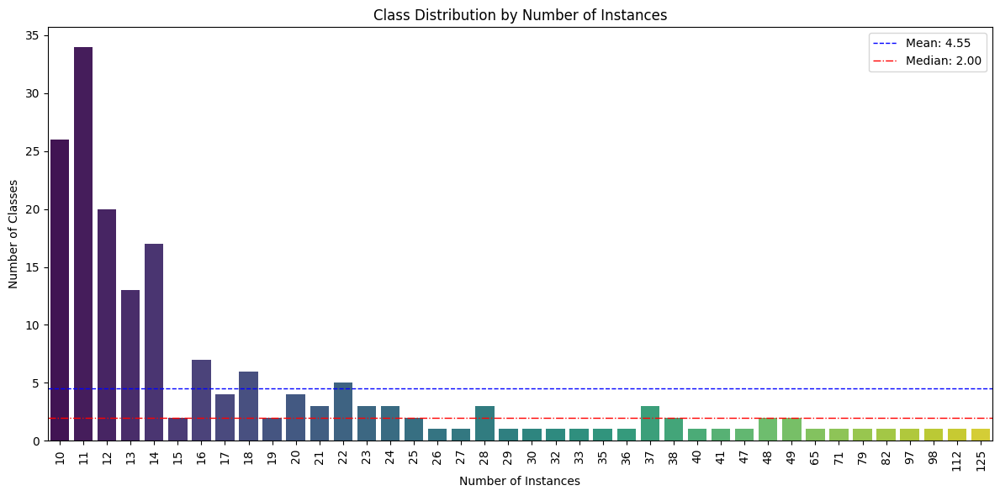

In [60]:
class_dist = df['identity'].value_counts()


instance_count_distribution = class_dist.value_counts().sort_index()  # Group by image count and sort

# Calculate mean and median
mean_value = instance_count_distribution.mean()
median_value = instance_count_distribution.median()

# Plotting the distribution
plt.figure(figsize=(12, 6))
sns.barplot(x=instance_count_distribution.index, y=instance_count_distribution.values, palette="viridis")
plt.title("Class Distribution by Number of Instances")
plt.xlabel("Number of Instances")
plt.ylabel("Number of Classes")
plt.xticks(rotation=90)

# Adding mean and median lines
plt.axhline(mean_value, color="blue", linestyle="--", linewidth=1, label=f"Mean: {mean_value:.2f}")
plt.axhline(median_value, color="red", linestyle="-.", linewidth=1, label=f"Median: {median_value:.2f}")

# Displaying the legend
plt.legend()

plt.tight_layout()
plt.show()

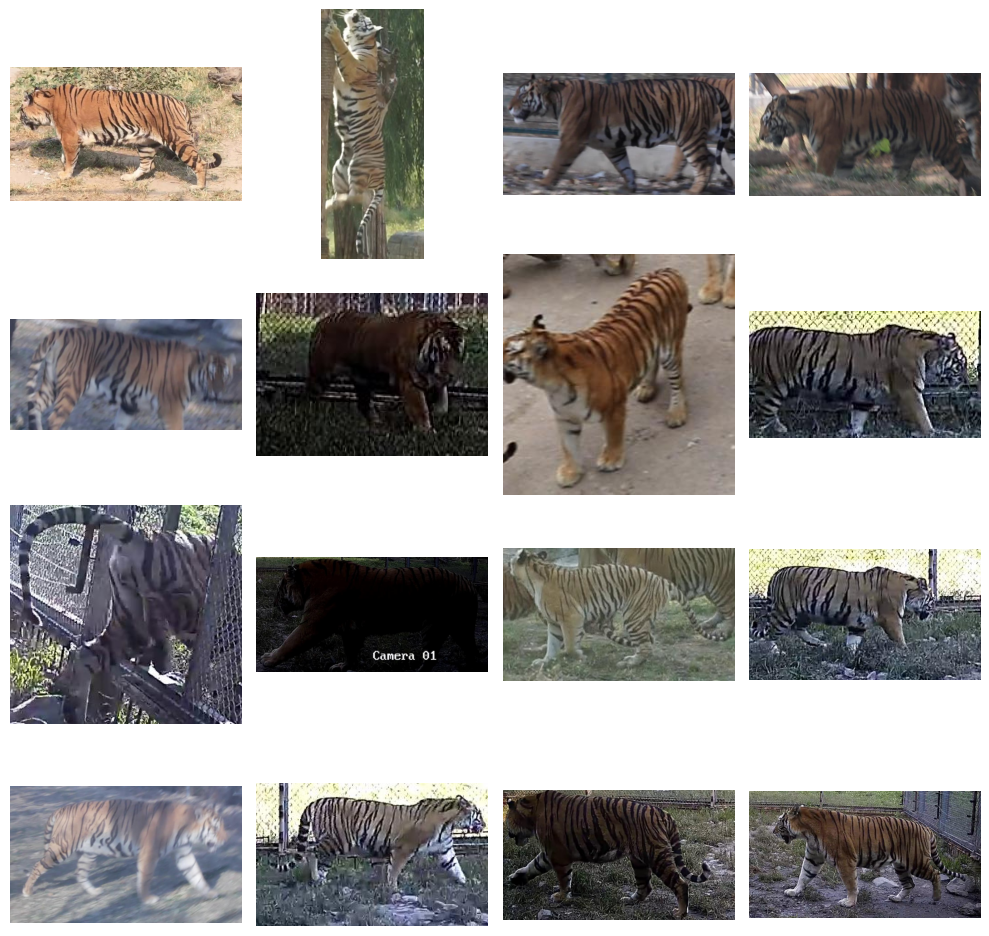

In [63]:
def visualize_random_sample(df, location_column, num_samples = 16, grid_size =(4, 4)):
    # Get random samples
    sample = df[location_column].sample(n=num_samples).tolist()
    fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=(10, 10))
    axes = axes.ravel()
    for i, img_path in enumerate(sample):
        img = Image.open(os.path.join('../data/ATRW', img_path))  # Load the image
        axes[i].imshow(img)
        axes[i].axis('off')  # Hide axes
    
    # Hide unused subplots if the number of samples is less than the grid capacity
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

visualize_random_sample(df, 'path')


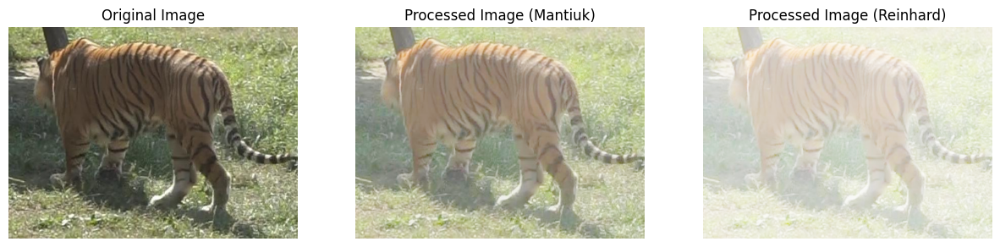

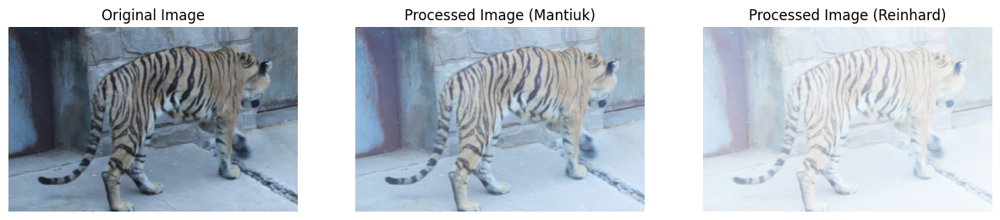

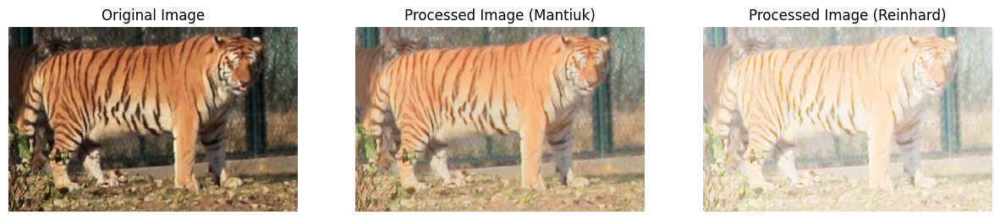

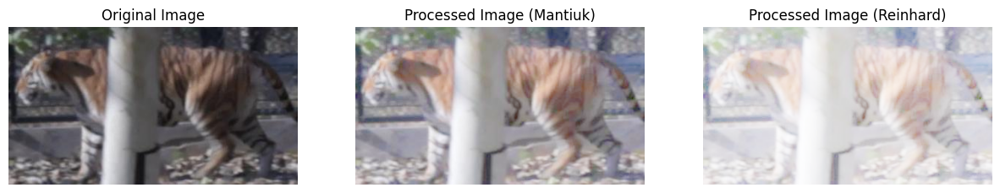

C:\Users\matej\AppData\Local\Temp\ipykernel_121276\3002582927.py:43: RuntimeWarning: invalid value encountered in cast
  mantiuk_image = np.clip(mantiuk_image * 255, 0, 255).astype(np.uint8)  # Convert to 8-bit format for display


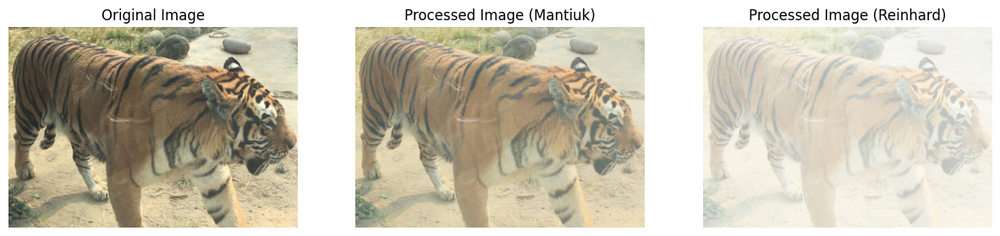

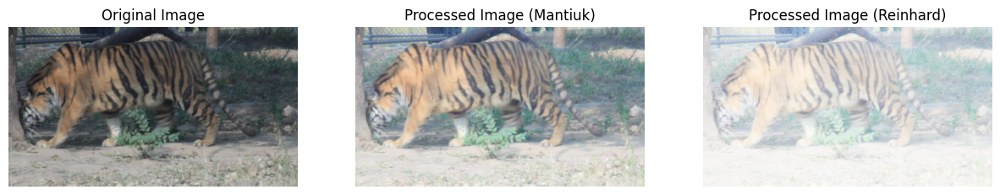

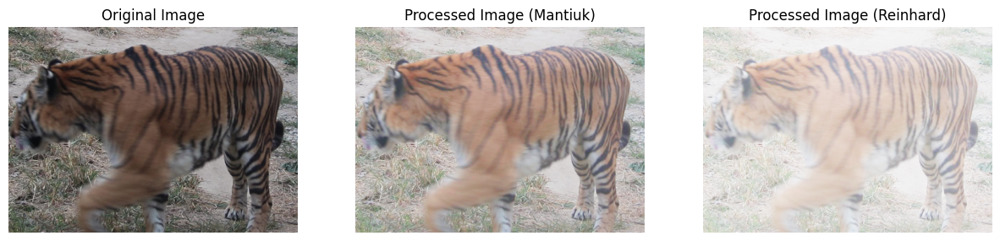

C:\Users\matej\AppData\Local\Temp\ipykernel_121276\3002582927.py:47: RuntimeWarning: invalid value encountered in cast
  reinhard_image = np.clip(reinhard_image * 255, 0, 255).astype(np.uint8)  # Convert to 8-bit format for display


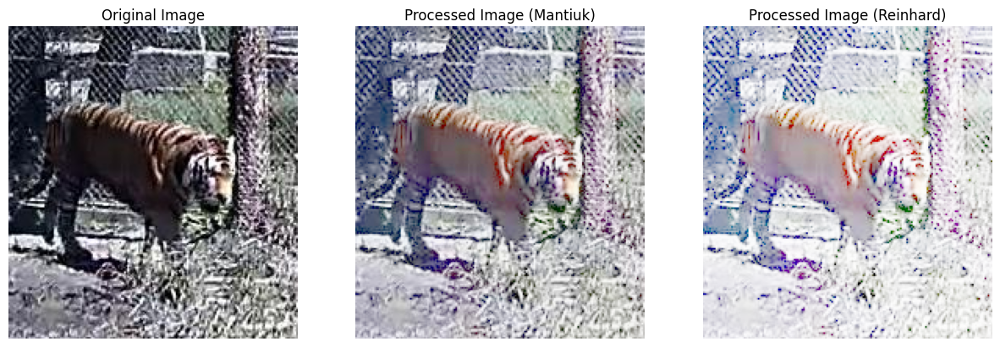

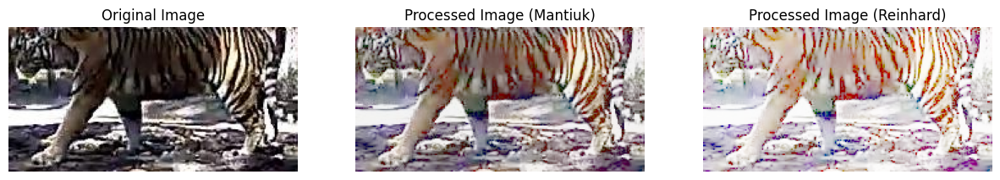

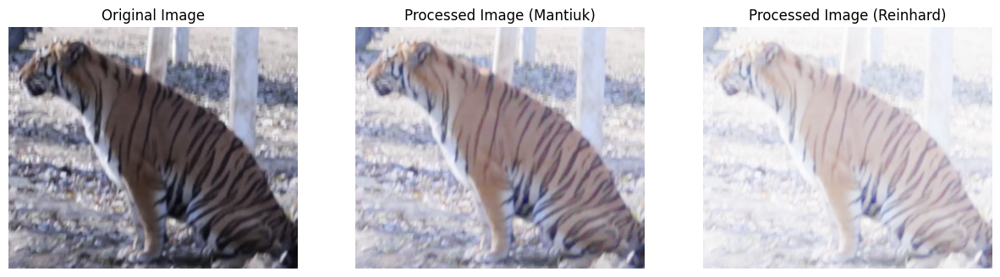

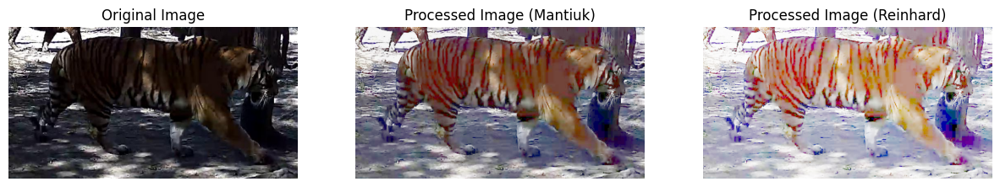

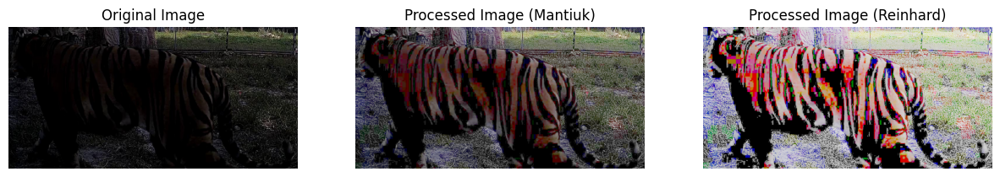

...

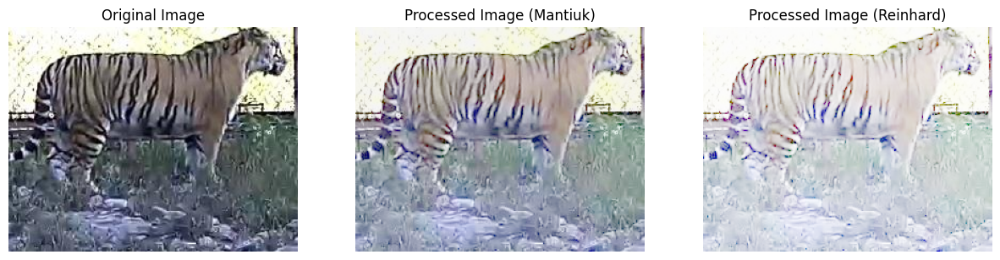

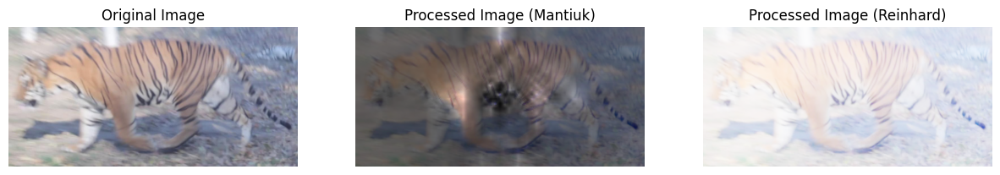

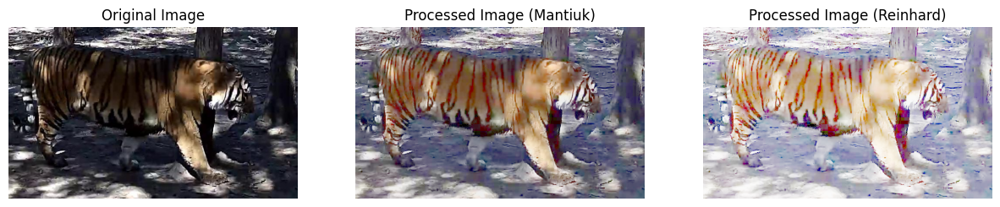

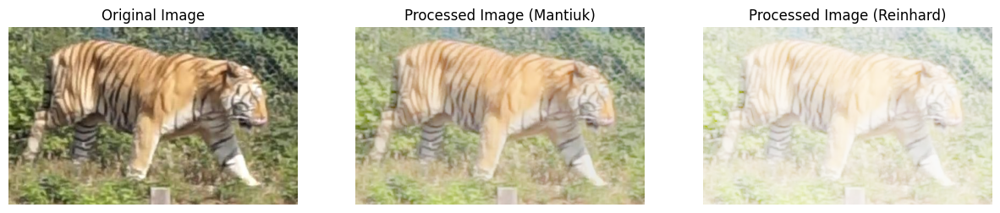

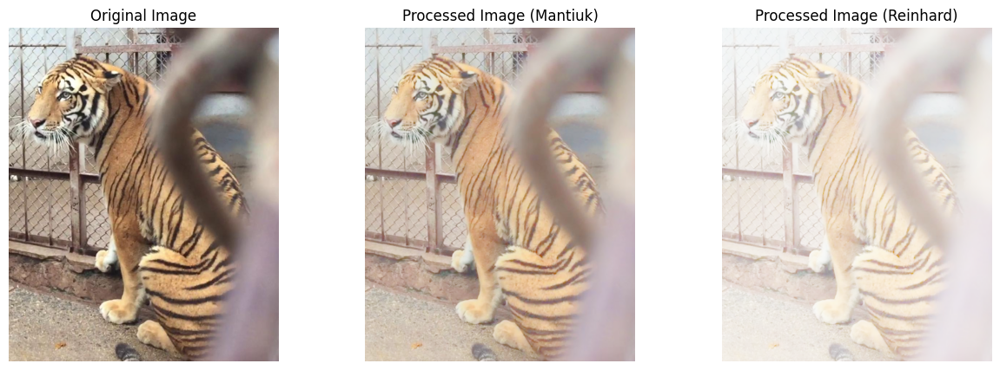

In [64]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Mantiuk and Reinhard Tone Mapping setup
tonemapMantiuk = cv2.createTonemapMantiuk(scale=0.7, saturation=0.7)
tonemapReinhard = cv2.createTonemapReinhard(gamma=2.2, intensity=0, light_adapt=1.0, color_adapt=0.0)

# Display original, Mantiuk-processed, and Reinhard-processed images side by side
def display_images_side_by_side(original_image, mantiuk_image, reinhard_image):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original Image
    axes[0].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original Image')
    axes[0].axis('off')
    
    # Mantiuk Processed Image
    axes[1].imshow(cv2.cvtColor(mantiuk_image, cv2.COLOR_BGR2RGB))
    axes[1].set_title('Processed Image (Mantiuk)')
    axes[1].axis('off')
    
    # Reinhard Processed Image
    axes[2].imshow(cv2.cvtColor(reinhard_image, cv2.COLOR_BGR2RGB))
    axes[2].set_title('Processed Image (Reinhard)')
    axes[2].axis('off')
    
    plt.show()

# Sample from the dataframe
sample = df['path'].sample(n=20).tolist()

for path in sample:
    # Load the image from the dataset
    original_image = cv2.imread(os.path.join('../data/ATRW', path))
    
    # Ensure the image is in the correct format
    original_image = original_image.astype(np.float32) / 255.0
    
    # Apply Mantiuk tone-mapping
    mantiuk_image = tonemapMantiuk.process(original_image)
    mantiuk_image = np.clip(mantiuk_image * 255, 0, 255).astype(np.uint8)  # Convert to 8-bit format for display
    
    # Apply Reinhard tone-mapping
    reinhard_image = tonemapReinhard.process(original_image)
    reinhard_image = np.clip(reinhard_image * 255, 0, 255).astype(np.uint8)  # Convert to 8-bit format for display
    
    # Display the original and processed images side by side
    display_images_side_by_side(original_image, mantiuk_image, reinhard_image)
